The Goal of this python notebook is to take an experimental look at Convolutional Neural Networks.

I will seek to implement several different model types and draw conclusions on the model by training them on the fruit-360 dataset with all 131 fruit classes.
The models will be compared to each other at the end.

In [2]:
import tensorflow as tf 
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import matplotlib.image as mpimg

In [3]:
data_dir = os.getcwd() + '/fruits-360/'
train_dir = data_dir + 'Training/'
test_dir = data_dir + 'Test/'
multi_test_dir = data_dir+'test-multiple_fruits/'

This an experimentation on the Fruit-360 database

The database contains 131 varieties of Fruit that can be classified, with training images of size 100 x 100. This database is tricky as fruit can have many different orientations and angles. The low pixel count also makes clasification difficult as features are less distinct. The similarity of fruit can make it even more tricky since many fruit will look similar to circular red blobs To help releive some of these issues data augmentation is applied rotating, skewing and mirroring images to help generate more general data to feed to models The models discussed represent different methods to tackling a problem such as fruit classificaton and their downsides. I should note that if the number of classes were consolidated, and greater quality images had been applied the outcome could be better

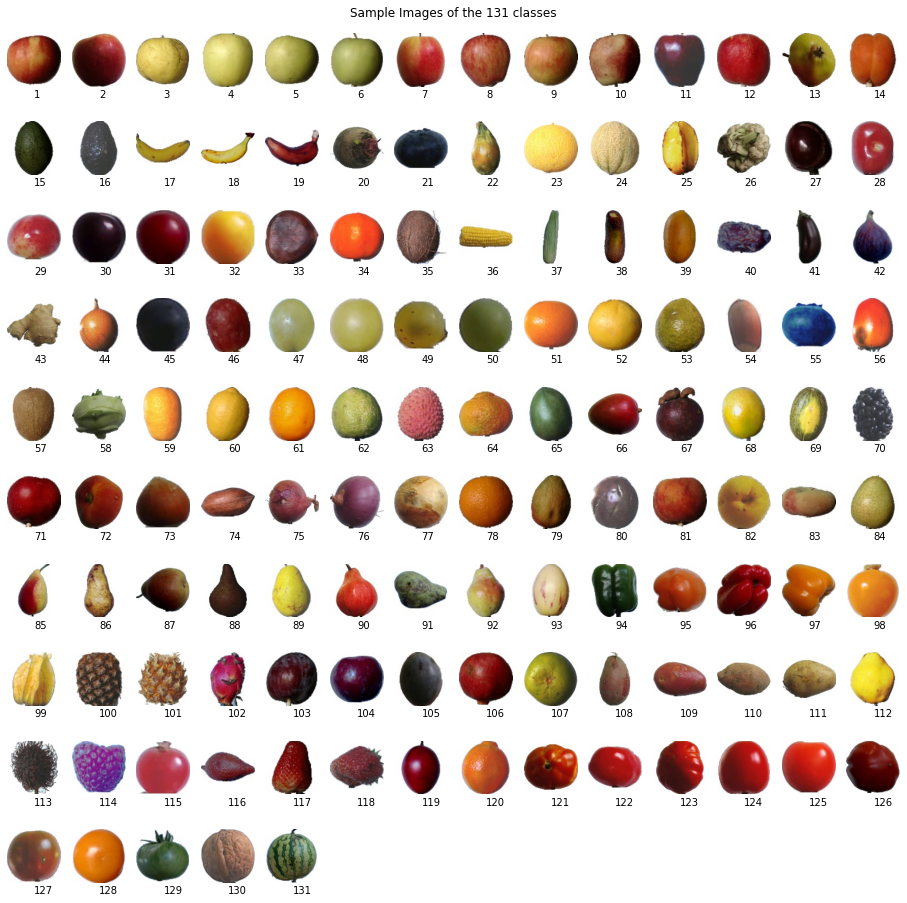

In [4]:
classes = os.listdir(train_dir)
classes.sort()
images = []
classesSize = []
for folder in classes:
    imageFiles = os.listdir(train_dir+folder)
    images.append(train_dir+folder+'/'+imageFiles[0])
    classesSize.append(len(imageFiles))
fig = plt.figure(figsize=(16,16))
plt.title(label='Sample Images of the '+str(len(classes))+' classes')
plt.axis('off')
for i, img in enumerate(images):
    fig.add_subplot(10,14,i+1)
    image = mpimg.imread(img)
    plt.imshow(image)
    plt.text(x = 50, y =120, s=str(i+1))
    plt.axis('off')

Now when tracking dataset performance it is important that the data is dsitributed between classes fairly equally as to prevent overfitting on the training set. This will allow the model to better generalize to a more equal distribution rather than creating too much variance due to bias in training data. As we can see there is about 500 images per fruit, although few do have as high as 1000.

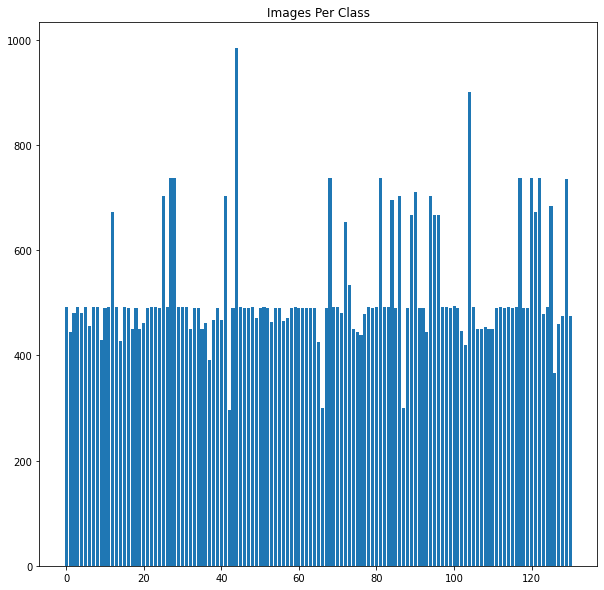

In [4]:
plt.figure(figsize=(10,10))
plt.bar(x=range(len(classes)), height= classesSize, )
plt.title(label='Images Per Class')
plt.show()

Using the keras API we can create TF databases for the training and test set that will automatically create batches, shuffle the data and rescale pixels values to a distribution between 0 and 1.
Batch Size for training Data will be around 50 and 20 for test data.

All Images will be conformed to 100 by 100

In [5]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1.0/255)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1.0/255)
train_gen = train_datagen.flow_from_directory(train_dir, class_mode='categorical', batch_size = 200, target_size=(100,100), shuffle=True)
test_gen = test_datagen.flow_from_directory(test_dir, class_mode='categorical', batch_size=300, target_size=(100,100), shuffle=True)

Found 67692 images belonging to 131 classes.
Found 22688 images belonging to 131 classes.


After analyzing the data and now organizing the data for training we can now create models and evaluate them


This will be the first model, 'small_model'. The model is a CNN with 3 convolutional layers and 2 Fully Connected Layers that are fed into a softmax layer.

To train we will use categorical cross entropy for loss with RMSPROP as the optimizer for gradient descent

In [31]:
small_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=16, kernel_size=3, data_format='channels_last', input_shape=(100,100,3), padding='same'),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='valid'),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=512),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dense(units=131),
    tf.keras.layers.Activation('softmax'),
])
small_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

These callbacks will help to save the best model in training and also help decrease the learning rate as we approach the global minimum or are stuck in a n-dimensional saddle point


In [32]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='small_model.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1)

In [33]:
history = small_model.fit(train_gen, steps_per_epoch=135, epochs=50, verbose=1, callbacks=[checkpointer, learningRateDecay], validation_data=test_gen, validation_freq=1)

Epoch 1/50
135/135 [==============================] - ETA: 0s - loss: 1.2125 - accuracy: 0.7102
Epoch 00001: val_loss improved from inf to 0.45041, saving model to small_model.hdf5
135/135 [==============================] - 15s 108ms/step - loss: 1.2125 - accuracy: 0.7102 - val_loss: 0.4504 - val_accuracy: 0.8792 - lr: 0.0010
Epoch 2/50
134/135 [============================>.] - ETA: 0s - loss: 0.0911 - accuracy: 0.9751
Epoch 00002: val_loss improved from 0.45041 to 0.27758, saving model to small_model.hdf5
135/135 [==============================] - 15s 110ms/step - loss: 0.0906 - accuracy: 0.9753 - val_loss: 0.2776 - val_accuracy: 0.9327 - lr: 0.0010
Epoch 3/50
135/135 [==============================] - ETA: 0s - loss: 0.0215 - accuracy: 0.9950
Epoch 00003: val_loss improved from 0.27758 to 0.23834, saving model to small_model.hdf5
135/135 [==============================] - 14s 104ms/step - loss: 0.0215 - accuracy: 0.9950 - val_loss: 0.2383 - val_accuracy: 0.9468 - lr: 0.0010
Epoch 4/

In [34]:
small_model = tf.keras.models.load_model('small_model.hdf5')
small_model.evaluate(test_gen)

76/76 [==============================] - 7s 94ms/step - loss: 0.1484 - accuracy: 0.9702


[0.14836281538009644, 0.9702045321464539]

As we can see validation loss is at low 0.1484 and the model has attained an accuracy of 0.97. This is extremly promising and impressive. Looking at our loss and accuracy over time both follow the same pattern and decrease over epoch cycles before plateuing.

This reveals that we are not facing a Variance problem since loss is pretty stable as the model attains 0.00001 loss on trianing. Rather this is a possible bias or data augmentation problem due to the large gap between validation and train loss.

It is not expected to be equal ,however

In [5]:
def plotData(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    epochs = np.arange(0,len(acc)*5, 5)
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    fig = plt.figure(figsize=(10,5))

    fig.add_subplot(1,2,1)
    plt.title('Accuracy over Epochs')
    plt.plot(epochs, acc, label='Train Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.ylim(bottom=0)
    plt.legend()
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')

    fig.add_subplot(1,2,2)
    plt.title('Loss over Epochs')
    plt.plot(epochs, loss, label='Train Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.ylim(bottom=0)
    plt.legend()
    plt.ylabel('Loss')
    plt.xlabel('Epochs')

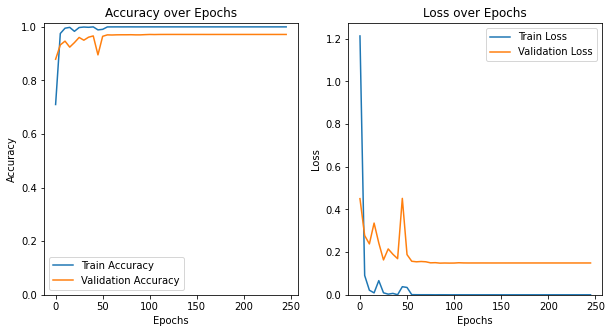

In [40]:
plotData(history)

We can now visually see how the model performs cycling through 20 random fruit pictures, it performs admirably ,but there are still noticeable failures such as beetroot registering as a potato. Although in this picture they do look awfully similiar. So maybe human attainment on this data set is lower than 100%. This means that the small model is already a great fit.


In [6]:
def visuallyInspect(model):
    uploads = random.choices(os.listdir(test_dir), k = 20)
    size = len(uploads)
    fig = plt.figure(figsize=(50,50))
    for i, file in enumerate(uploads):
        path = test_dir + file
        path = path +'/'+ random.choice(os.listdir(path))
        img = tf.keras.preprocessing.image.load_img(path, target_size=(100, 100))
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        saved = mpimg.imread(path)
        fig.add_subplot(10,10,i+1)
        plt.imshow(saved)
    
        plt.axis('off')
        pred = model.predict(img)
        plt.text(x=0, y=0, s=classes[np.argmax(pred)],fontsize=20)

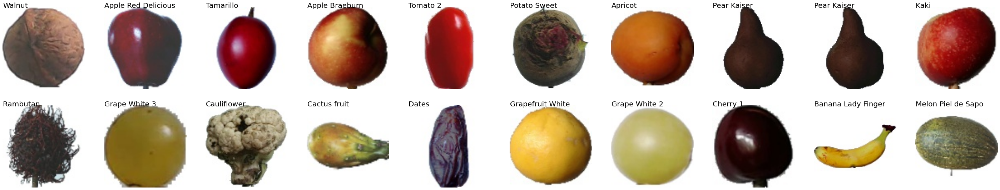

In [42]:
visuallyInspect(small_model)

In [7]:
def classDisribution(model):
    classList = os.listdir(test_dir)
    classList.sort()
    accuracy = []
    for i, folder in enumerate(classList):
        folderList = os.listdir(test_dir+folder)
        imgs = []
        for file in folderList:
            img = tf.keras.preprocessing.image.load_img(test_dir+folder+'/'+file, target_size=(100,100))
            img = tf.keras.preprocessing.image.img_to_array(img)
            imgs.append(img)
        imgs = np.stack(imgs, axis=0)
        predictions = np.argmax(model.predict(imgs), axis=1)
        correct = float(np.sum(predictions == i))*100
        accuracy.append(correct/len(folderList))
    plt.figure(figsize=(15,10))
    plt.bar(x=list(range(1,132)), height = accuracy)
    plt.show()

This graph shows the accuracy for each class and we can see all classes are being classified with a mahority have 80% or greater accuracy. With many reaching 100%. There are some that perform poorly however and some of these do overlap with lower data images

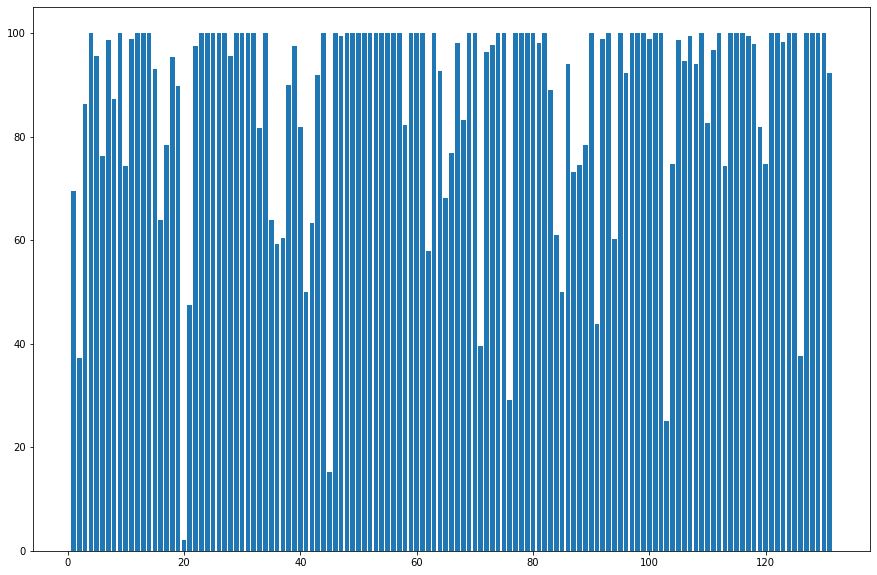

In [43]:
classDisribution(small_model)

Looking at the previous model I concluded there is a possible data augmentation issue or a bias problem. The latter would mean a more complex model could solve the issue. The former means we would either have to augment the data or get more data.

The data is only 100 by 100 so data augmentaion would most likely be too destructive due to a low pixel count.

The next model adds another convolutional layer while doubling the channel depth at each layer. This should result in more feature detection and a more complex model that could fit classification better

In [64]:
medium_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=3, data_format='channels_last', input_shape=(100,100,3)),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=64, kernel_size=3, input_shape=(100,100,3)),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=64, kernel_size=3, input_shape=(100,100,3)),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(filters=128, kernel_size=3, input_shape=(100,100,3)),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units = 1024),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dense(units=131),
    tf.keras.layers.Activation('softmax'),
])
medium_model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

In [66]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='medium_model.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1)

In [67]:
history = medium_model.fit(train_gen, steps_per_epoch=135, epochs=40, callbacks=[checkpointer, learningRateDecay], validation_data=test_gen, verbose=1)

Epoch 1/40
134/135 [============================>.] - ETA: 0s - loss: 2.9931 - accuracy: 0.2649
Epoch 00001: val_loss improved from inf to 1.38600, saving model to medium_model.hdf5
135/135 [==============================] - 10s 76ms/step - loss: 2.9808 - accuracy: 0.2673 - val_loss: 1.3860 - val_accuracy: 0.6047 - lr: 0.0010
Epoch 2/40
133/135 [============================>.] - ETA: 0s - loss: 0.8942 - accuracy: 0.7380
Epoch 00002: val_loss improved from 1.38600 to 0.86664, saving model to medium_model.hdf5
135/135 [==============================] - 10s 76ms/step - loss: 0.8887 - accuracy: 0.7391 - val_loss: 0.8666 - val_accuracy: 0.7604 - lr: 0.0010
Epoch 3/40
133/135 [============================>.] - ETA: 0s - loss: 0.4570 - accuracy: 0.8656
Epoch 00003: val_loss improved from 0.86664 to 0.50694, saving model to medium_model.hdf5
135/135 [==============================] - 10s 75ms/step - loss: 0.4522 - accuracy: 0.8670 - val_loss: 0.5069 - val_accuracy: 0.8585 - lr: 0.0010
Epoch 4/

This model seems to have regressed from the smaller model this probably indicates overfitting and introduction of variance. Still loss is still low and 96% accuracy is also good

In [76]:
medium_model = tf.keras.models.load_model('medium_model.hdf5')
medium_model.evaluate(test_gen)

76/76 [==============================] - 7s 94ms/step - loss: 0.2604 - accuracy: 0.9589


[0.26038888096809387, 0.9588769674301147]

The loss trajectory of Validation is alot more variable this can also be a sign of overfitting, since loss seems to not be decreasing per epoch and rather slowly increasing towards the end

Text(0.5, 0, 'Epochs')

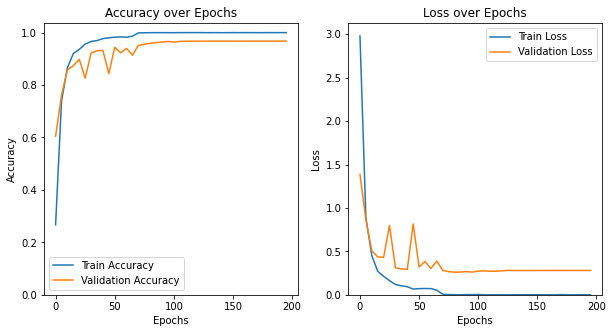

In [70]:
plotData(history)

In [ ]:
The medium model also does pretty well classifying al but the kiwi correctly, impressive

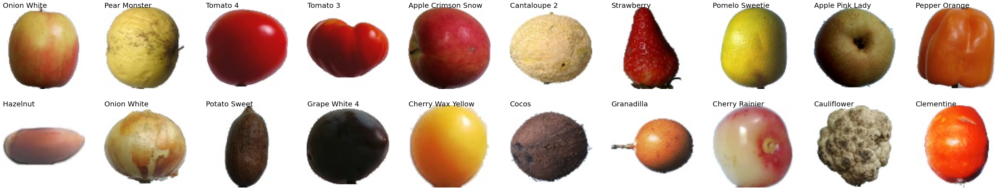

In [77]:
visuallyInspect(medium_model)

The class distribution seems slightly regressed from the smaller model since somce classes fail all examples, alhtough those classes that do not seem to be close to 100% accuracy rather than 80 or so in the smaller model

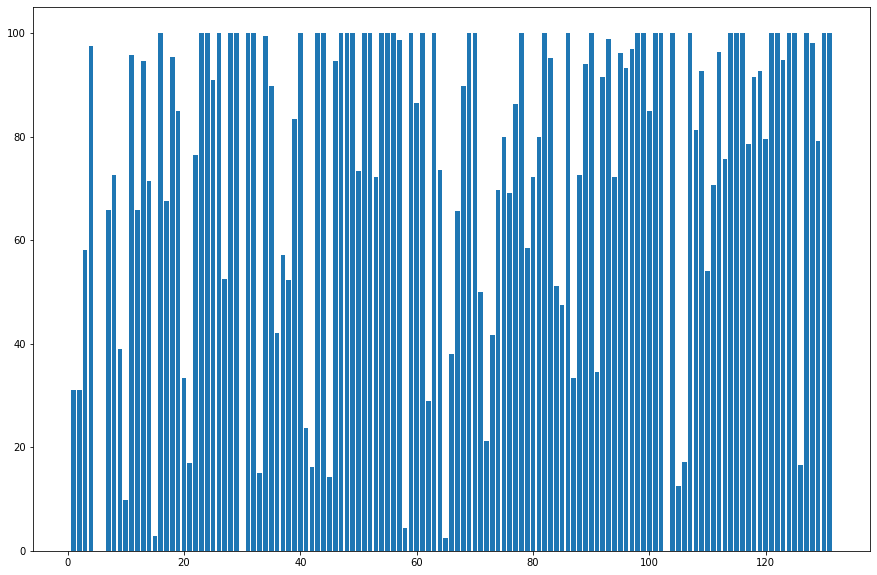

In [80]:
classDisribution(medium_model)

Since the results for the medium model were mixed lets introduce a larger model to see if indeed a larger model was needed. This model adds another convolutional layer and another fully connected layer as well as a larger channel depth

In [82]:
large_model = tf.keras.models.Sequential([
    # convolutional layer 1 made of 2 convolutions and maxpool
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', data_format='channels_last', input_shape=(100,100,3)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 2 
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same',activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 3
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='valid', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 4
    tf.keras.layers.Conv2D(filters=256, kernel_size=3, padding='valid', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # Fully Connected Network formed and evaluated after convoltional layers
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=1024, activation='relu'),
    tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=131, activation='softmax')
])
large_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [83]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='large_model.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)

In [84]:
history = large_model.fit(train_gen, steps_per_epoch=135, epochs=40, callbacks=[checkpointer, learningRateDecay], validation_data=test_gen, verbose=1)

Epoch 1/40
135/135 [==============================] - ETA: 0s - loss: 4.2506 - accuracy: 0.0809
Epoch 00001: val_loss improved from inf to 2.99689, saving model to large_model.hdf5
135/135 [==============================] - 20s 147ms/step - loss: 4.2506 - accuracy: 0.0809 - val_loss: 2.9969 - val_accuracy: 0.2380 - lr: 0.0010
Epoch 2/40
135/135 [==============================] - ETA: 0s - loss: 1.7049 - accuracy: 0.5216
Epoch 00002: val_loss improved from 2.99689 to 1.65850, saving model to large_model.hdf5
135/135 [==============================] - 19s 142ms/step - loss: 1.7049 - accuracy: 0.5216 - val_loss: 1.6585 - val_accuracy: 0.6009 - lr: 0.0010
Epoch 3/40
135/135 [==============================] - ETA: 0s - loss: 0.7500 - accuracy: 0.7756
Epoch 00003: val_loss improved from 1.65850 to 1.11289, saving model to large_model.hdf5
135/135 [==============================] - 19s 144ms/step - loss: 0.7500 - accuracy: 0.7756 - val_loss: 1.1129 - val_accuracy: 0.7157 - lr: 0.0010
Epoch 4/

The larger model is slightly worse from the medium model we saw earlier. This is a clear sign of variance and possible overfitting, and the below loss per epoch graphs show a similar story

In [85]:
large_model = tf.keras.models.load_model('large_model.hdf5')
large_model.evaluate(test_gen)

76/76 [==============================] - 10s 130ms/step - loss: 0.3067 - accuracy: 0.9538


[0.30669185519218445, 0.9538081884384155]

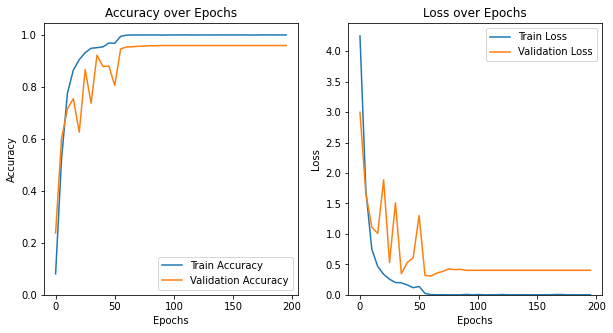

In [86]:
plotData(history)

This model classifies 3 wrong not bad but definitively worse than some of the earlier model

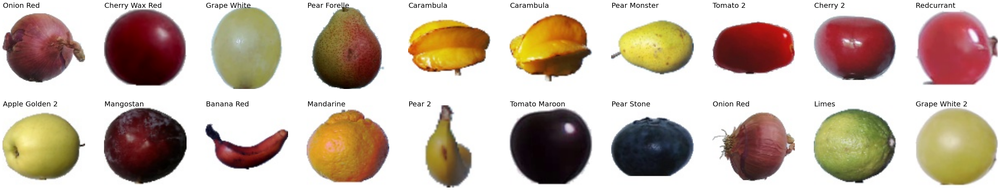

In [87]:
visuallyInspect(large_model)

Class accuracy are very similar to the medium model although it is classifying a lot more classes higher on average

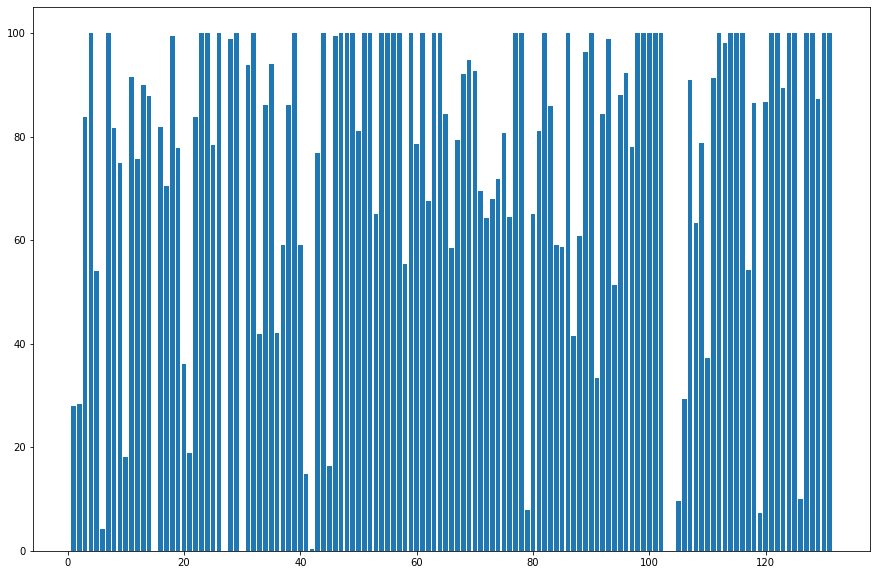

In [88]:
classDisribution(large_model)

Lets see if we can combat overfitting by adding regularization. I have added dropout with a rate of 0.3 to the first fully connected layer and to the second last fully connected layer with a rate of 0.2

In [10]:
dropout_model1 = tf.keras.models.Sequential([
    # convolutional layer 1 made of 2 convolutions and maxpool
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', data_format='channels_last', input_shape=(100,100,3)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 2 
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same',activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 3
    tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='valid', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    # convoltional layer 4
    tf.keras.layers.Conv2D(filters=256, kernel_size=3, padding='valid', activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Dropout(0.3),
    # Fully Connected Network formed and evaluated after convoltional layers
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=1024, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=131, activation='softmax')
])
dropout_model1.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [11]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='dropout_model1.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1)

In [12]:
history = dropout_model1.fit(train_gen, steps_per_epoch=135, epochs=40, callbacks=[checkpointer, learningRateDecay], validation_data=test_gen, verbose=1)

Epoch 1/40
135/135 [==============================] - ETA: 0s - loss: 3.2938 - accuracy: 0.2400
Epoch 00001: val_loss improved from inf to 1.62409, saving model to dropout_model1.hdf5
135/135 [==============================] - 48s 355ms/step - loss: 3.2938 - accuracy: 0.2400 - val_loss: 1.6241 - val_accuracy: 0.5714 - lr: 0.0010
Epoch 2/40
135/135 [==============================] - ETA: 0s - loss: 0.7870 - accuracy: 0.7750
Epoch 00002: val_loss did not improve from 1.62409
135/135 [==============================] - 45s 335ms/step - loss: 0.7870 - accuracy: 0.7750 - val_loss: 2.8711 - val_accuracy: 0.4874 - lr: 0.0010
Epoch 3/40
135/135 [==============================] - ETA: 0s - loss: 0.4071 - accuracy: 0.8961
Epoch 00003: val_loss improved from 1.62409 to 0.44858, saving model to dropout_model1.hdf5
135/135 [==============================] - 45s 334ms/step - loss: 0.4071 - accuracy: 0.8961 - val_loss: 0.4486 - val_accuracy: 0.8868 - lr: 0.0010
Epoch 4/40
135/135 [====================

In [13]:
dropout_model1 = tf.keras.models.load_model('dropout_model1.hdf5')
dropout_model1.evaluate(test_gen)

76/76 [==============================] - 10s 132ms/step - loss: 0.2469 - accuracy: 0.9472


[0.24685557186603546, 0.9472408294677734]

Accuracy is similar to the large model but as we can see loss have fallen from 0.3 to 0.2 and the loss and accuracy plots are a lot smoother and less variable

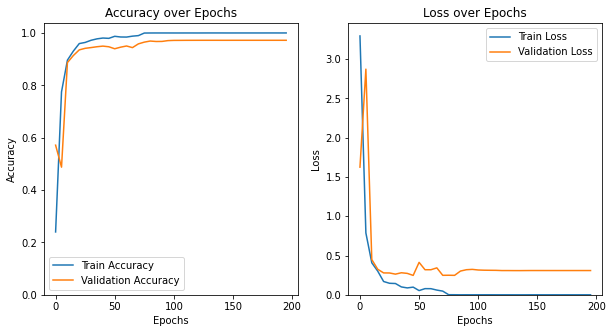

In [14]:
plotData(history)

Similar to the large model it performs well but there are several errors. So lets go back to the smaller model and apply dropout

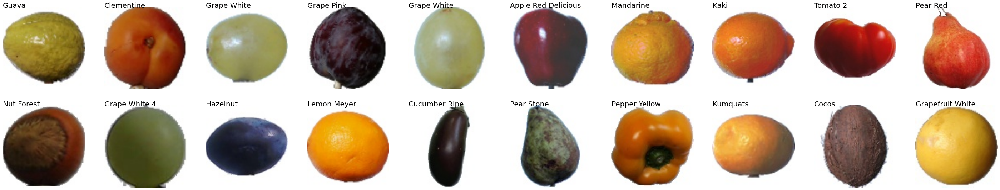

In [17]:
visuallyInspect(dropout_model1)

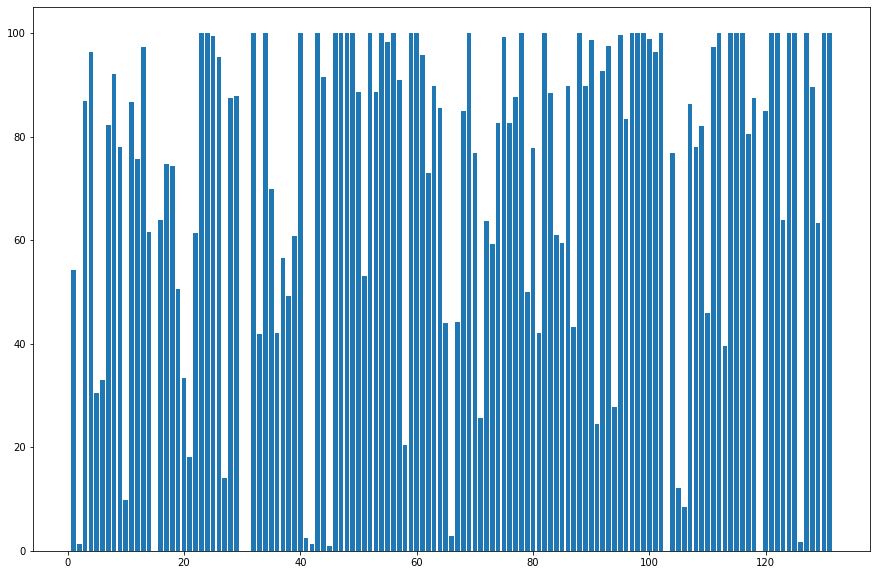

In [16]:
classDisribution(dropout_model1)

This model takes the first model and adds only one convolutional layer and adds dropout to the last 3 layers.

The extra convolutional layer should help add more complexity helping with the bias from the first model

Dropout should help to prevent overfitting and combat possible variance

In [16]:
dropout_model2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters = 16, kernel_size = 2,input_shape=(100,100,3),padding='same'),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    tf.keras.layers.Conv2D(filters = 32,kernel_size = 2,activation= 'relu',padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    tf.keras.layers.Conv2D(filters = 64,kernel_size = 2,activation= 'relu',padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    tf.keras.layers.Conv2D(filters = 128,kernel_size = 2,activation= 'relu',padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(150),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(131, activation = 'softmax')
])
dropout_model2.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics=['accuracy'])

In [17]:
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='dropout_model2.hdf5', monitor='val_loss', verbose=1, save_best_only=True)
learningRateDecay = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, verbose=1)

In [18]:
history = dropout_model2.fit(train_gen, steps_per_epoch = 135, epochs=50, validation_data= test_gen, callbacks = [checkpointer, learningRateDecay], verbose=1, shuffle=True)

Epoch 1/50
135/135 [==============================] - ETA: 0s - loss: 3.4215 - accuracy: 0.1917
Epoch 00001: val_loss improved from inf to 1.67825, saving model to dropout_model2.hdf5
135/135 [==============================] - 15s 110ms/step - loss: 3.4215 - accuracy: 0.1917 - val_loss: 1.6783 - val_accuracy: 0.5997 - lr: 0.0010
Epoch 2/50
135/135 [==============================] - ETA: 0s - loss: 1.4724 - accuracy: 0.5585
Epoch 00002: val_loss improved from 1.67825 to 0.79572, saving model to dropout_model2.hdf5
135/135 [==============================] - 15s 109ms/step - loss: 1.4724 - accuracy: 0.5585 - val_loss: 0.7957 - val_accuracy: 0.7877 - lr: 0.0010
Epoch 3/50
135/135 [==============================] - ETA: 0s - loss: 0.7893 - accuracy: 0.7490
Epoch 00003: val_loss improved from 0.79572 to 0.59221, saving model to dropout_model2.hdf5
135/135 [==============================] - 14s 105ms/step - loss: 0.7893 - accuracy: 0.7490 - val_loss: 0.5922 - val_accuracy: 0.8285 - lr: 0.0010

In [19]:
dropout_model2 = tf.keras.models.load_model('dropout_model2.hdf5')
dropout_model2.evaluate(test_gen)

76/76 [==============================] - 7s 89ms/step - loss: 0.1418 - accuracy: 0.9795


[0.1418009102344513, 0.9795486330986023]

As we can see this model has the best outcome with the lowest loss and 98% accuracy

Looking at the model the loss and accuracy are fairly smooth and follow the training data well, this indicates little variance or bias

The validation does start to seperate at the end but this possible a data augmentation issue or a lack of features

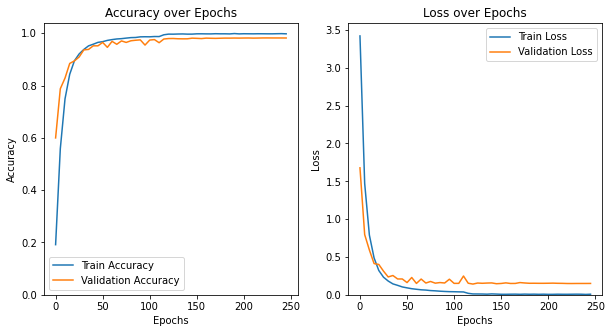

In [20]:
plotData(history)

The model gets all but two correct which is a great outcome considering it is slightly better than the small model

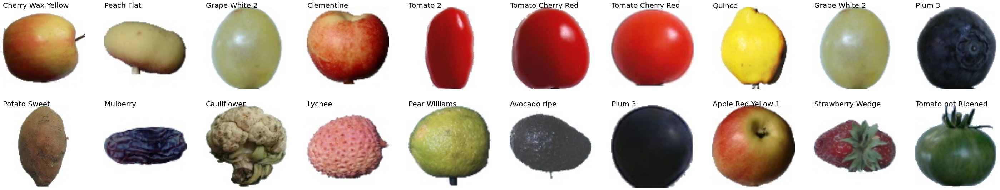

In [25]:
visuallyInspect(dropout_model2)

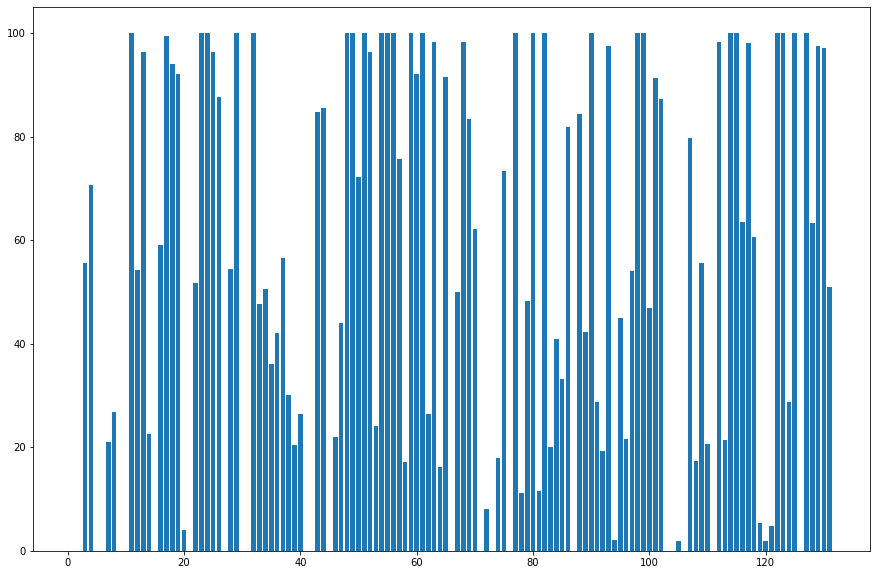

In [22]:
classDisribution(dropout_model2)

We can now visually compare the models on similar images for helpful personal assuarance that the models are working as intended

In [6]:
model = tf.keras.models.load_model('131_class_models/dropout_model2.hdf5')
dropout_model = tf.keras.models.load_model('131_class_models/dropout_model1.hdf5')
large_model = tf.keras.models.load_model('131_class_models/large_model.hdf5')
medium_model = tf.keras.models.load_model('131_class_models/medium_model.hdf5')
small_model = tf.keras.models.load_model('131_class_models/small_model.hdf5')

In [7]:
model.evaluate(test_gen)
dropout_model.evaluate(test_gen)
large_model.evaluate(test_gen)
medium_model.evaluate(test_gen)
small_model.evaluate(test_gen)

76/76 [==============================] - 7s 97ms/step - loss: 0.1484 - accuracy: 0.9702


[0.14836284518241882, 0.9702045321464539]

1. The model with the best loss is the 2nd dropout model and is first on the list
2. The model with the second best loss is the smallest model
3. The model with the third best loss is the 1st dropout model
4. The model with the fourth best loss is the medium model
5. The model with the worst loss was the largest model

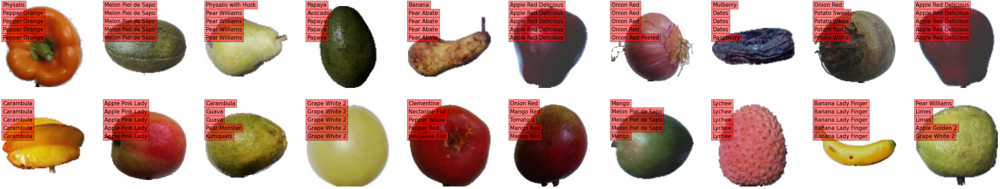

In [22]:
uploads = random.choices(os.listdir(test_dir), k = 20)
size = len(uploads)
fig = plt.figure(figsize=(50,50))
for i, file in enumerate(uploads):
    path = test_dir + file
    path = path +'/'+ random.choice(os.listdir(path))
    img = tf.keras.preprocessing.image.load_img(path, target_size=(100, 100))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    saved = mpimg.imread(path)
    fig.add_subplot(10,10,i+1)
    plt.imshow(saved)
  
    plt.axis('off')
    pred1 = model.predict(img)
    pred2 = small_model.predict(img)
    pred3 = dropout_model.predict(img)
    pred4 = medium_model.predict(img)
    pred5 = large_model.predict(img)
    
    plt.text(x=0, y=0, s=classes[np.argmax(pred1)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))
    plt.text(x=0, y=10, s=classes[np.argmax(pred2)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))
    plt.text(x=0, y=20, s=classes[np.argmax(pred3)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))
    plt.text(x=0, y=30, s=classes[np.argmax(pred4)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))
    plt.text(x=0, y=40, s=classes[np.argmax(pred5)],fontsize=15, bbox=dict(facecolor='red', alpha=0.5))

Conclusion: I would consider the dataset fairly difficult certain fruits look remarkably similar and with the 100 by 100 pixel size feature extraction can be difficult.
On top of this the 131 classes is quite a lot for very similar fruit such as 4 varieties of red apples and green apples

Despite this the above model using a combination of dropout and our smaller original model was able to achieve 98% accuracy

To test whether reducing similar or redundant classes and conglomerating similar ones will help our model I decreased the number of classes from 131 to 76 in the 76_fruit_class_classifier notebook